# Otoczka wypukła

In [50]:
import numpy as np
import pandas as pd

from labs.tests.test2 import Test
from labs.visualizer.main import Visualizer
from time import time
np.random.seed(1234)

### Przydatne funkcje i stałe

In [51]:
def visualizeGraph( points , graham_points , fileName) :
    vis = Visualizer()
    vis.add_point(points , color = invalid )
    vis.add_point( graham_points , color = correct )
    vis.add_line_segment([(graham_points[i], graham_points[i+1]) for i in range(len(graham_points)-1)] , color = correct )
    vis.add_line_segment([graham_points[-1], graham_points[0]] , color = correct )
    vis.save( ImgDir + fileName )
    vis.show()

In [52]:
def pointsClassifactionPrint( hullPoints , pointsQ ):
    hullPointsL = len( hullPoints )
    pointsL = len( pointsQ )
    print(f"Liczba wszystkich punktów : {pointsL}")
    print(f"Liczba punktów nie należących do otoczki : {pointsL - hullPointsL} ")
    print(f"Liczba punktów należących do otoczki : {hullPointsL} ")
    print( f"Punkty należące do otoczki : { hullPoints }" )

In [53]:
notChecked = "green"
correct = "red"
invalid = "black"
tempCorrect = "orange"
eps = 1e-24
ImgDir = "Imgs/"
ReportsDir = "Reports/"

In [54]:
def mat_det_3x3(a, b, c):
    """
    Obliczanie wyznacznika macierzy 3x3
    :param a: krotka współrzędnych (x, y) pierwszego punktu tworzącego naszą prostą
    :param b: krotka współrzędnych (x, y) drugiego punktu tworzącego naszą prostą
    :param c: krotka współrzędnych (x, y) punktu, którego położenie względem prostej chcemy znaleźć
    :return: wartość wyznacznika macierzy
    """
    return ( b[0] - a[0] )*( c[1] - b[1] ) - ( b[1] - a[1] )*( c[0] - b[0] )

### Przykładowe zastosowanie narzędzia do wizualizacji

In [55]:
def draw_example_1():
    vis = Visualizer()

    # point = (x, y)
    points = [
        (-62.781083483620016, 9.295526540248986),
        (-10.543100198806997, -26.080520917553812),
        (-81.64932184252287, -74.42163273030921),
        (-36.297317058417946, -72.91194239793609),
        (37.795092197502356, 57.71110085986143),
        (62.511149567563905, -29.172821102708937),
        (21.82806671019955, 2.647377124715007),
        (-46.24539555503924, 42.65521594922478),
        (-77.92302295134137, -7.666110427206263),
        (25.85862324263843, 62.49564419388622),
        (-27.71649622636616, -67.33453457840331),
        (94.83039177581244, -55.52473300629532),
        (-26.29675918891381, -51.30150933048958),
        (-70.11654929355294, 16.723865705806816),
        (26.682887992598097, -65.55763984116587),
        (57.03377667841906, -55.56635171240132),
        (-16.053624841650247, -42.333295668531456),
        (-56.810858686395505, -37.41219002465095),
        (15.604076302407279, -24.85779870929437),
        (-71.77261869976445, -12.306083264402673),
    ]
    # line_segment = ((x1, y1), (x2, y2))
    line_segments = [
        ((-81.64932184252287, -74.42163273030921), (-36.297317058417946, -72.91194239793609)),
        ((-36.297317058417946, -72.91194239793609), (26.682887992598097, -65.55763984116587)),
        ((26.682887992598097, -65.55763984116587), (94.83039177581244, -55.52473300629532)),
        ((94.83039177581244, -55.52473300629532), (37.795092197502356, 57.71110085986143)),
        ((37.795092197502356, 57.71110085986143), (25.85862324263843, 62.49564419388622)),
        ((25.85862324263843, 62.49564419388622), (-46.24539555503924, 42.65521594922478)),
        ((-46.24539555503924, 42.65521594922478), (-70.11654929355294, 16.723865705806816)),
        ((-70.11654929355294, 16.723865705806816), (-77.92302295134137, -7.666110427206263)),
        ((-77.92302295134137, -7.666110427206263), (-81.64932184252287, -74.42163273030921)),
    ]
    vis.add_point(points, color= notChecked)
    vis.add_line_segment(line_segments, color= correct )
    vis.show()
    vis.save( ImgDir + "example1")

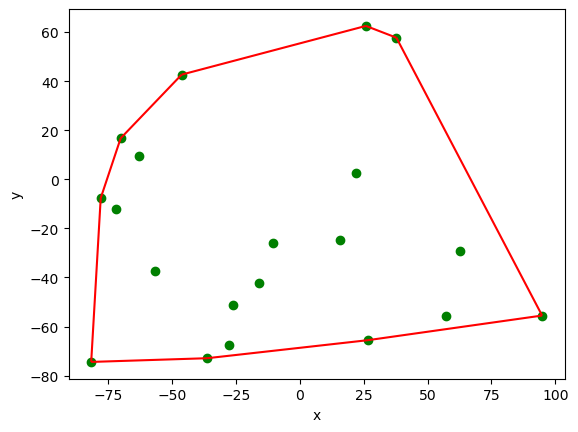

In [56]:
draw_example_1()

### Wprowadzenie

Czym jest otoczka wypukła?  
Podzbiór płaszczyzny $Q$ nazywamy wypukłym iff, gdy dla dowolnej pary punktów $p, q \in Q$ odcinek $\overline{pq}$ jest całkowicie zawarty w $Q$.  
Otoczka wypukła $\mathcal{CH}(Q)$ zbioru $Q$ jest najmniejszym wypukłym zbiorem zawierającym $Q$.

### Zastosowania otoczku wypukłej

Otoczki wypukłe - w szczególności otoczki wypukłe w przestrzeni trójwymiarowej - są spotykane w różnych zastosowaniach. Na przykład używa się ich do przyspieszania wykrywania kolizji w animacji komputerowej. Przepuśćmy, że chcemy sprawdzić, czy dwa obiekty $\mathcal{P_1}$ i $\mathcal{P_2}$ przecinają się. Jeśli przez większość czasu odpowiedź na to pytanie jest negatywna, to opłaca się następująca strategia. Przybliżamy obiekty przez prostrze obiekty $\widehat{\mathcal{P_1}}$ i $\widehat{\mathcal{P_2}}$, które zawierały orginały. Jeśli chcemy sprwadzić, czy $\mathcal{P_1}$ i $\mathcal{P_2}$ przecinają się, najpierw sprawdzamy, czy przecinają się $\widehat{\mathcal{P_1}}$ i $\widehat{\mathcal{P_2}}$. Jeśli występuje ten przypadek, to powinniśmy wykonać test na orginalnych obiektach, który jest przepuszczalnie znacznie kosztowniejszy.  
Sprawdzanie przecięcia otoczek wypukłych jest bardziej skomplikowane niż dla sfer - choć mimo to łatwiejsze niż dla obiektów niewypukłych - ale otoczki wypukłe mogą dużo lepiej przybliżać większość obiektów.

## Generowanie losowych punktów na płaszczyźnie 

Zapoznaliśmy się i wiemy jak generowac losowe punkty na płaszczyźnie z laboratorium I (współrzędne rzeczywiste typu *double* - podwójna precyzja obliczeń). Przygotuj zestawy punktów, które będzie można użyć jako testowe dla algorytmów obliczania otoczki wypukłej.

Uzupełnij funkcję ```generate_uniform_points```.

In [11]:
def generate_uniform_points(left=-100, right=100, n=100):
    """
    Funkcja generuje równomiernie n punktów na kwadwratowym
    obszarze od left do right (jednakowo na osi y)
    o współrzędnych rzeczywistych
    :param left: lewy kraniec przedziału
    :param right: prawy kraniec przedziału
    :param n: ilość generowanych punktów
    :return: tablica punktów w postaci krotek współrzędnych
             np. [(x1, y1), (x2, y2), ... (xn, yn)]
    """
    return [ tuple( point ) for point in np.random.uniform( left , right , (n,2) ) ]

<span style="color:red">Ćw.</span> Wygeneruj $100$ losowych punktów w przestrzeni 2D o współrzędnych z przedziału $x \in \langle -100,100 \rangle$ oraz $y \in \langle -100,100\rangle$.

In [60]:
points_a = generate_uniform_points(-100, 100, 100)

Zwizualizuj wygenerowane punkty.

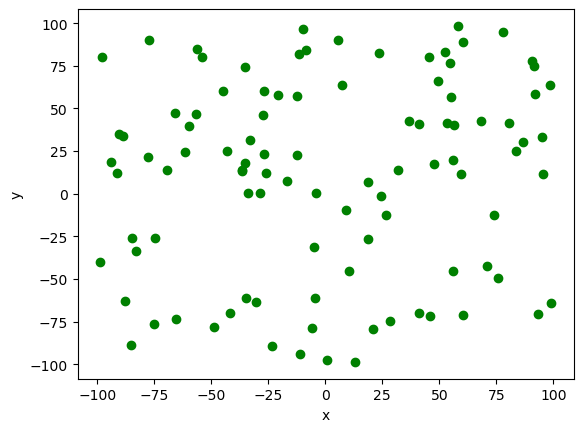

In [13]:
# visualize(points_a)
vis = Visualizer()
vis.add_point(points_a, color = notChecked )
vis.show()
vis.save( ImgDir + "A")

Uzupełnij funkcję ```generate_circle_points```.

In [14]:
def generate_circle_points(O, R, n=100):
    """
    Funkcja generuje jednostajnie n punktów na okręgu o środku O i promieniu R
    :param O: krotka współrzędnych x, y określająca środek okręgu
    :param R: promień okręgu
    :param n: ilość generowanych punktów
    :return: tablica punktów w postaci krotek współrzędnych
    """
    X = [np.random.uniform( 0, 2 * np.pi ) for _ in range( n )]
    return [( O[0] + R * np.cos(x) , O[1] + R * np.sin(x) ) for x in X]



<span style="color:red">Ćw.</span> Wygeneruj $100$ losowych punktów w przestrzeni 2D leżących na okręgu o środku $O = (0,0)$ i promieniu $R = 10$.

In [59]:
points_b = generate_circle_points((0, 0), 10, 100)

Zwizualizuj wygenerowane punkty.

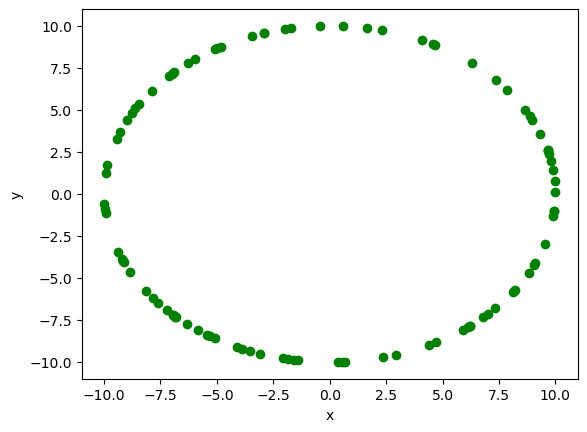

In [16]:
# visualize(points_b)
vis.clear()
vis.add_point(points_b, color = notChecked)
vis.show()
vis.save( ImgDir + "B")

Jak można było zauważyć, to funkcje ```generate_uniform_points``` oraz ```generate_circle_points``` są takie same jak w laboratorium I.

Uzupełnij funkcję ```generate_rectangle_points```.

In [17]:
def generate_rectangle_points(a=(-10, -10), b=(10, -10), c=(10, 10), d=(-10, 10), n=100):
    '''
    Funkcja generuje n punktów na obwodzie prostokąta
    o wierzchołkach w punktach a, b, c i d
    :param a: lewy-dolny wierzchołek prostokąta
    :param b: prawy-dolny wierzchołek prostokąta
    :param c: prawy-górny wierzchołek prostokąta
    :param d: lewy-górny wierzchołek prostokąta
    :param n: ilość generowanych punktów
    :return: tablica punktów w postaci krotek współrzędnych
    '''

    width = abs( a[0] ) + abs( b[0] )
    height = abs( a[1] ) + abs( c[1] )

    L = 2 * ( height + width )

    bottom = width
    right = bottom + height
    top = right + width

    points = [np.random.uniform( 0 , L ) for _ in range( n )]
    result = []

    for point in points :
        if point < bottom :
            x = a[0] + point
            y = a[1]

        elif point < right :
            x = b[0]
            y = b[1] + ( point - bottom )

        elif point < top :
            x = a[0] + ( point - right )
            y = c[1]
        else :
            x = a[0]
            y = a[1] + ( point - top )
        result.append( ( x , y ) )

    return result

<span style="color:red">Ćw.</span> Wygeneruj $100$ losowych punktów w przestrzeni 2D leżących na obwodzie prostokąta, którego wyznaczają wierzchołki
$(-10,-10), (10,-10), (10,10)$ oraz $(-10,10)$.

In [58]:
points_c = generate_rectangle_points(
    (-10, -10), (10, -10), (10, 10), (-10, 10), 100)

Zwizualizuj wygenerowane punkty.

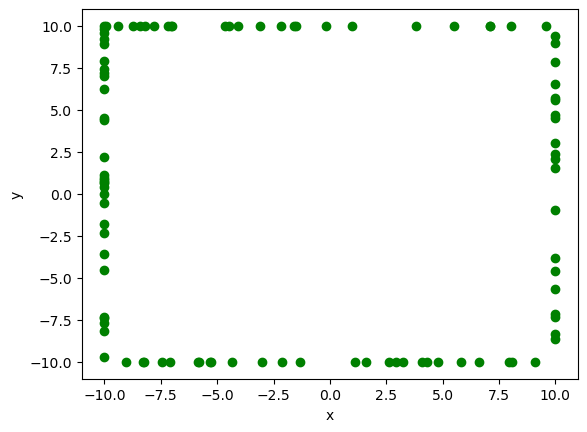

In [48]:
# visualize(points_c)
vis.clear()
vis.add_point(points_c, color = notChecked)
vis.show()
vis.save( ImgDir + "C")

Uzupełnij funkcję ```generate_square_points```.

In [19]:
def generate_square_points(a=(0, 0), b=(10, 0), c=(10, 10), d=(0, 10),
                           axis_n=25, diag_n=20):
    '''
    Funkcja generuje axis_n punktów na dwóch bokach kwadratu
    leżących na osiach x i y oraz diag_n punktów na
    przektąnych kwadratu, którego wyznaczają punkty
    a, b, c i d.
    :param a: lewy-dolny wierzchołek kwadratu
    :param b: prawy-dolny wierzchołek kwadratu
    :param c: prawy-górny wierzchołek kwadratu
    :param d: lewy-górny wierzchołek kwadratu
    :param axis_n: ilość generowanych punktów na każdym
                   z dwóch boków kwadratu równoległych do osi x i y
    :param diag_n: ilość generowanych punktów na każdej
                   przekątnej kwadratu
    :return: tablica punktów w postaci krotek współrzędnych
    '''

    result = []

    for _ in range( axis_n ) :
        result.append( ( a[0] , np.random.uniform( a[1] , d[1] ) ) )
        result.append( ( np.random.uniform( a[0] , b[0] ) , a[1] ) )

    for _ in range( max( 0 , diag_n - 4 ) ) :
        Xa_c = np.random.uniform( a[0] , b[0] )
        Xb_d = np.random.uniform( a[0] , b[0] )
        result.append( ( Xb_d , d[1] - Xb_d ) )
        result.append( ( Xa_c , Xa_c ) )

    result.extend( [ a , b , c , d ] )

    return result



<span style="color:red">Ćw.</span> Wygeneruj losowe punktów w przestrzeni 2D w następujący sposób: po 25 punktów na dwóch bokach kwadratu leżących na osiach, po 20 punktów na przekątnych kwadratu oraz punkty wyznaczające kwadrat $(0, 0), (10, 0), (10, 10), (0, 10)$.

In [57]:
points_d = generate_square_points(
    (0, 0), (10, 0), (10, 10), (0, 10), 25, 20)

Zwizualizuj wygenerowane punkty.

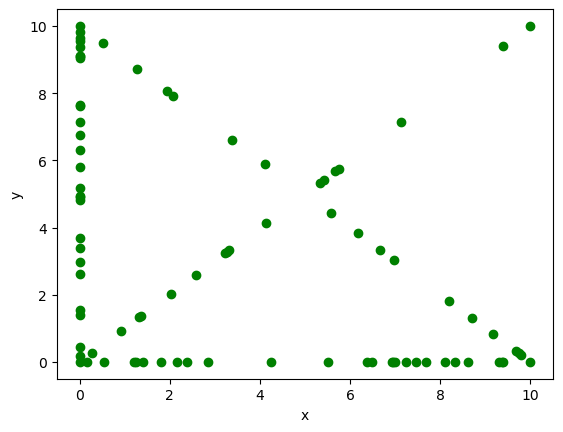

In [49]:
# visualize(points_d)
vis.clear()
vis.add_point(points_d , color = notChecked )
vis.show()
vis.save( ImgDir + "D")

## Algorytm Grahama oraz algorytm Jarvisa

Po przygotowaniu przykładowych zbiorów danych i ich zwizualizowaniu, chcemy zobaczyć jak buduje się dla nich otoczka wypukła z wykorzystaniem różnych algortymów.  
W tych dwóch algorytmach potrzebna będzie funkcja którą już dobrze znamy, czyli funkcja, która sprawdza po której stornie prostej znajduje się punkt.  
Dla każdego algorytmu trzeba będzie zaimplementować dwie funkcje obliczające otoczkę wypukłę, ze względu, że jedna z nich będzie miała możliwość wyświetlania kroków postępowania w algorytmie. Druga funkcja będzie uzyteczna do porównywania czasów dla różnych zbiorów danych i względęm algorytmów.  
W graficznej funkcji danego algorytmu, jednym kolorem powinny być zaznaczone wszystkie punkty zbioru wyjściowego, drugim kolorem boki aktualne rozpatrywane, a trzecim boki wielokąta otoczki. Po zakończeniu wyznaczania otoczki, wierzchołki otoczki powinny być wyróżnione (osobnym kolorem bądź kształtem).  

### Algorytm Grahama

Algorytm Grahama tworzy otoczkę wypukłą poprzez utrzymywanie stosu $S$, w którym znajdują się punkty, które mogą, ale nie muszą tworzyć otoczki wypukłej. Za każdym razem jest wstawiany na stos (push) jeden punkt z zbioru punktów $Q$ i jest on usuwany ze stosu (pop), jeżeli nie jest punktem $\mathcal{CH}(Q)$. Kiedy algorytm kończy się, stos $S$ zawiera tylko punkty otoczki wypukłej $\mathcal{CH}(Q)$ w kierunku przeciwnym do ruchu wskazówek zegera.

---

Procedura $\mathtt{Graham-Build(Q)}$ przyjmuje zbiór punktów $Q$, gdzie $|Q| \geq 3$. Wywołuje ona funkcję $\mathtt{TOP(S)}$, która zwraca punkt z góry stosu bez zmieniania $S$ oraz
$\mathtt{NEXT-TO-TOP(S)}$, która zwraca punkt ponieżej góry stosu $S$, bez zmieniania stosu. Funkcja $\mathtt{PUSH(p, S)}$ wstawia punkt $p$ na stos $S$. Funkcja $\mathtt{POP(p, S)}$ usuwa punkt $p$ ze stosu $S$.

$\mathtt{Graham-Build(Q)}$  
1)  niech $p_0$ będzie punktem w zbiorze Q z najmniejszą współrzędną $y$,  
    oraz najmniejszą współrzędną $x$ w przypadku, gdy wiele punktów ma tą samą współrzędną $x$  
    
2)  nich $\mathtt{\langle p_1, p_2, \dots, p_m \rangle}$ będzie pozostałym zbiorem punktów w $Q$ posortowanym  
    zgodnie z przeciwnym ruchem wskazówek zegara wokół punktu $p_0$  
    (jeżeli więcej niż jeden punkt ma ten sam kąt to usuwamy wszystkie punkty  
     z wyjątkiem tego najbardziej oddalonego od $p_0$)  
3) stwórz pusty stos $S$  
4) $\mathtt{PUSH(p_0, S)}$
5) $\mathtt{PUSH(p_1, S)}$
6) $\mathtt{PUSH(p_2, S)}$
7) **for** $i = 3$ **to** m  
8) &emsp;**while** kąt utworzony przez $\mathtt{NEXT-TO-TOP(S)}$, $\mathtt{TOP(S)}$ oraz $p_i$ tworzy lewostronny skręt
9) &emsp;&emsp;$\mathtt{POP(S)}$
10) &emsp;$\mathtt{PUSH(p_i, S)}$
11) **return** $S$


---

Lewostronny skręt oznacza, że dla trzech kolejnych punktów $a, b, c$, punkt $b$ leży po lewej stronie prostej $ac$.  
  

<span style="color:red">Ćw.</span> Uzupełnij funkcję ```graham_algorithm```, która oblicza otoczkę wypukłą korzystając z algorytmu Grahama.

In [22]:
def graham_algorithm(Q):
    '''
    Funkcja buduje otoczkę wypukłą dla podanego
    zbioru punktów Q algorymem Grahama
    :parm Q: zbiór punktów
    :return: tablica punktów w postaci krotek współrzędnych
    '''

    def preSorting() :
        def angleKey(x):
            vx = x[0] - Q[0][0]
            vy = x[1] - Q[0][1]
            angle = np.arctan2( vy , vx )
            distance = vx * vx + vy * vy
            return ( angle , distance )


        Q.sort( key = lambda x : ( x[1] , x[0] ) )
        Q_angles = { q : angleKey( q ) for q in Q }
        Q_sorted = [Q[0]] + sorted( Q[1:] , key = lambda x : Q_angles[x] )
        Q_filtered  = [ Q_sorted[0] ]
        for i in range( 1 , len( Q_sorted ) )  :
            while len( Q_filtered )> 1  and ( Q_angles[ Q_sorted[i] ][0] - Q_angles[ Q_filtered[-1] ][0] < eps ) :
                Q_filtered.pop()
            Q_filtered.append( Q_sorted[i] )

        return Q_filtered

    n = len( Q )
    if n < 3 :
        return Q

    Q = preSorting()

    n = len( Q )
    if n < 3 :
        return Q

    S = [ Q[0] , Q[1] ]
    for i in range( 2 , n ) :
        while len( S ) >=2 and mat_det_3x3( S[-2] , S[-1] , Q[i] ) <= eps  :
            S.pop()
        S.append( Q[i] )

    return S

Przetestuj swoją implementacje algorytmu Grahama, by sprawdzić czy poprawnie obliczana jest otoczka.

In [23]:
Test().runtest(1, graham_algorithm)

Lab 2, task 1:
	Test 1: Passed
	Test 2: Passed
	Test 3: Passed
	Test 4: Passed
	Test 5: Passed
	Test 6: Passed
	Test 7: Passed
	Test 8: Passed
	Test 9: Passed
	Test 10: Passed
	Test 11: Passed
Result: 11/11
Time: 1.406s


<span style="color:red">Ćw.</span> Uzupełnij funkcję ```graham_algorithm_draw```, która oblicza otoczkę wypukłą korzystając z algorytmu Grahama z dodatkową opcją wyświetlania kroków algorytmu.

In [24]:
def graham_algorithm_draw(Q):
    '''
    Funkcja buduje otoczkę wypukłą dla podanego
    zbioru punktów Q algorymem Grahama oraz
    pokazuje poszczególne kroki algorymu
    :parm Q: zbiór punktów
    :return: krotka w postaci (tablica punktów w postaci krotek współrzędnych,
                                wizualizer pokazujący kroki algorytmu) 
    '''
    def preSorting() :
            def angleKey(x):
                vx = x[0] - Q[0][0]
                vy = x[1] - Q[0][1]
                angle = np.arctan2( vy , vx )
                distance = vx * vx + vy * vy
                return ( angle , distance )


            Q.sort( key = lambda x : ( x[1] , x[0] ) )
            Q_angles = { q : angleKey( q ) for q in Q }
            Q_sorted = [Q[0]] + sorted( Q[1:] , key = lambda x : Q_angles[x] )
            Q_filtered  = [ Q_sorted[0] ]
            for i in range( 1 , len( Q_sorted ) )  :
                while len( Q_filtered )> 1  and ( Q_angles[ Q_sorted[i] ][0] - Q_angles[ Q_filtered[-1] ][0] < eps ) :
                    vis.add_point( Q_filtered[-1] , color = invalid )
                    Q_filtered.pop()

                Q_filtered.append( Q_sorted[i] )

            return Q_filtered

    vis = Visualizer()
    vis.add_point( Q , color = notChecked )

    n = len( Q )
    if n < 3 :
        if n >= 1 :
            vis.add_point( Q[0] , color = correct )
        for i in range( 1 , n ) :
            vis.add_line_segment( ( Q[i] , Q[i-1] ) , color = correct )
            vis.add_point( Q[i] , color = correct )
        return Q , vis

    Q = preSorting()

    n = len( Q )
    if n < 3 :
        if n >= 1 :
            vis.add_point( Q[0] , color = correct )
        for i in range( 1 , n ) :
            vis.add_line_segment( ( Q[i] , Q[i-1] ) , color = correct )
            vis.add_point( Q[i] , color = correct )
        return Q , vis

    S = [ Q[0] , Q[1] ]

    vis.add_point( S , color = correct )
    edges = [ vis.add_line_segment( ( S[0] , S[1] ) , color = correct ) ]

    for i in range( 2 , n ) :
        while len( S ) >=2 and mat_det_3x3( S[-2] , S[-1] , Q[i] ) <= eps   :

            vis.add_point( S[-1] , color = invalid )
            S.pop()
            vis.remove_figure( edges[-1] )
            edges.pop()

        vis.add_point( Q[i] , color = correct )
        edges.append( vis.add_line_segment( ( S[-1] , Q[i] ) , color = correct ) )
        S.append( Q[i] )


    return S , vis

Zwizualizuj swoją implementację algorytmu.

### Kolory na Wizualizacjach algorytmu Grahama :
- Zielony: Punkt, który nie został jeszcze sprawdzony.
- Czarny: Punkt nie należący do Otoczki Wypukłej.
- Czerwony: Punkt należący do Otoczki Wypukłej.

Zbiór danych A

In [25]:
graham_points_a, vis_graham_a = graham_algorithm_draw( points_a)

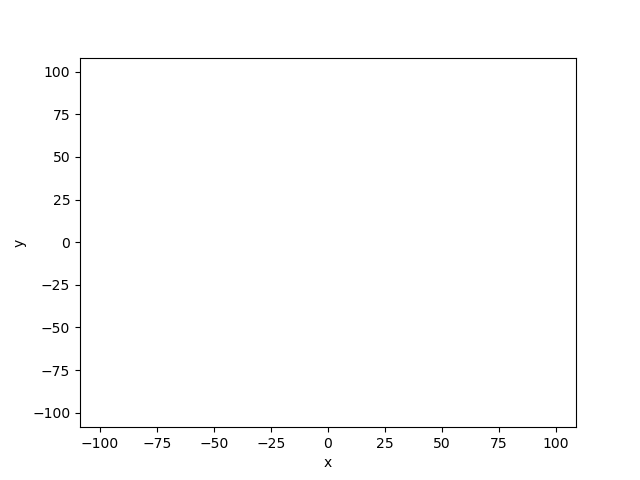

In [84]:
vis_graham_a.save_gif( ImgDir + "A_Graham_Gif" )
vis_graham_a.show_gif(interval=1)

In [26]:
pointsClassifactionPrint( graham_points_a , points_a )

Liczba wszystkich punktów : 100
Liczba punktów nie należących do otoczki : 88 
Liczba punktów należących do otoczki : 12 
Punkty należące do otoczki : [(np.float64(13.188928610106274), np.float64(-98.64718760199945)), (np.float64(93.16730639842552), np.float64(-70.56862002140056)), (np.float64(98.93076572885892), np.float64(-64.10042610612163)), (np.float64(98.71347257263474), np.float64(63.740702040785095)), (np.float64(90.43908196309548), np.float64(77.99265742840103)), (np.float64(78.11143758577145), np.float64(94.65295822373378)), (np.float64(58.10482661140668), np.float64(98.41629323767228)), (np.float64(-9.670318347828186), np.float64(96.40094830439091)), (np.float64(-77.18686025146751), np.float64(90.16197001682445)), (np.float64(-98.1302850999511), np.float64(80.12972423101837)), (np.float64(-98.75829668257413), np.float64(-39.87165884593977)), (np.float64(-85.33149127347636), np.float64(-88.99872091875527))]


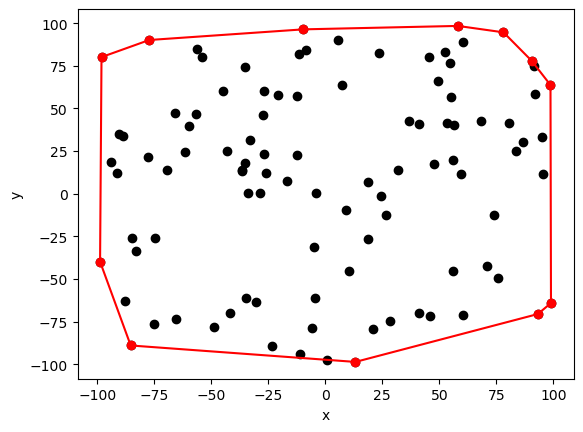

In [28]:
visualizeGraph( points_a , graham_points_a , "A_graham_Graph" )

Zbiór danych B

In [29]:
graham_points_b, vis_graham_b = graham_algorithm_draw(points_b)

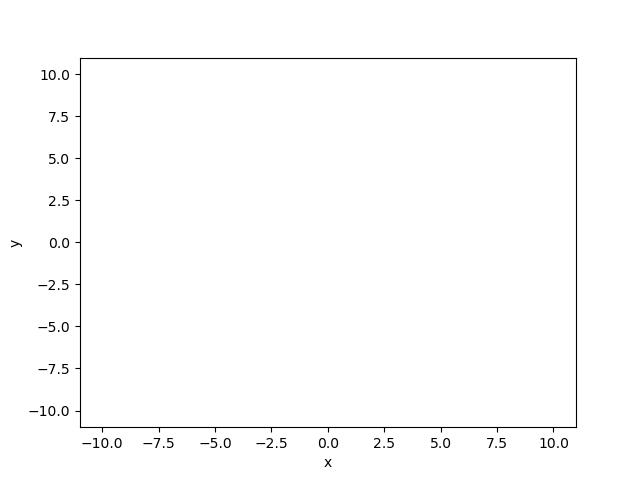

In [88]:
vis_graham_b.save_gif( ImgDir + "B_Graham_Gif" )
vis_graham_b.show_gif(interval=1)

In [89]:
pointsClassifactionPrint( graham_points_b , points_b )

Liczba wszystkich punktów : 100
Liczba punktów nie należących do otoczki : 0 
Liczba punktów należących do otoczki : 100 
Punkty należące do otoczki : [(np.float64(0.35719527512495297), np.float64(-9.99361854062023)), (np.float64(0.5516000078353471), np.float64(-9.984775281965842)), (np.float64(0.6811442079661532), np.float64(-9.97677515873512)), (np.float64(2.3605812248253524), np.float64(-9.7173893758047)), (np.float64(2.935076470294428), np.float64(-9.559567255557335)), (np.float64(4.380185321904426), np.float64(-8.989659423235844)), (np.float64(4.6903645904241795), np.float64(-8.831788041438438)), (np.float64(5.890641893343966), np.float64(-8.08086245919215)), (np.float64(6.131785171776727), np.float64(-7.899443689727717)), (np.float64(6.202156561875166), np.float64(-7.844313480604202)), (np.float64(6.221629765307303), np.float64(-7.828877509799358)), (np.float64(6.793583108384169), np.float64(-7.33806708537591)), (np.float64(6.994062322693752), np.float64(-7.147243680348088)), (np

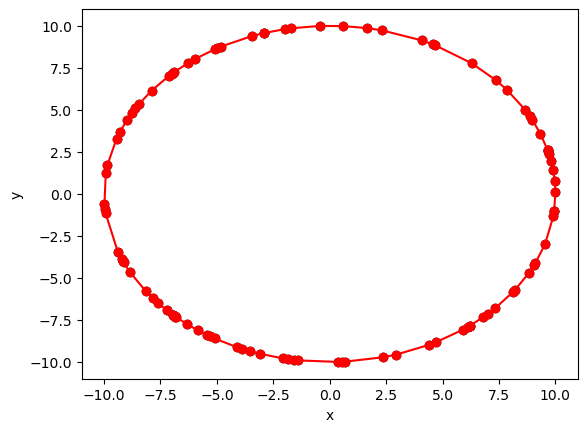

In [30]:
visualizeGraph( points_b , graham_points_b , "B_graham_Graph" )

Zbiór danych C

In [31]:
graham_points_c, vis_graham_c = graham_algorithm_draw(points_c)

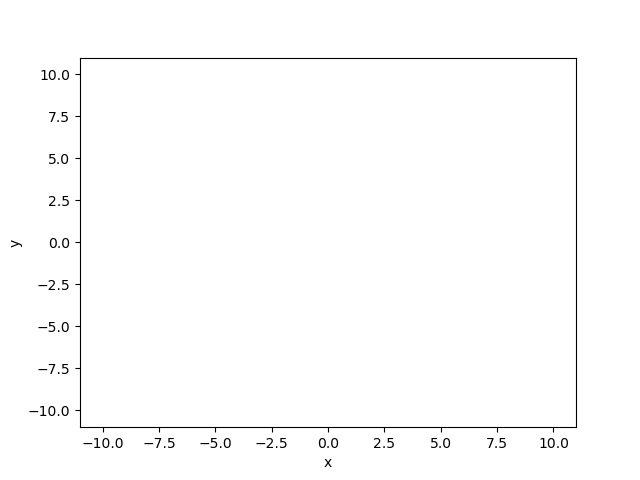

In [92]:
vis_graham_c.save_gif( ImgDir + "C_Graham_Gif" )
vis_graham_c.show_gif()

In [32]:
pointsClassifactionPrint( graham_points_c , points_c )

Liczba wszystkich punktów : 100
Liczba punktów nie należących do otoczki : 92 
Liczba punktów należących do otoczki : 8 
Punkty należące do otoczki : [(-9.023993096445757, -10), (9.105599152578385, -10), (10, -8.66074432616637), (10, 9.429428205238565), (9.581134129044258, 10), (-9.920763366224115, 10), (-10, 9.971967501615495), (-10, -9.716502320777039)]


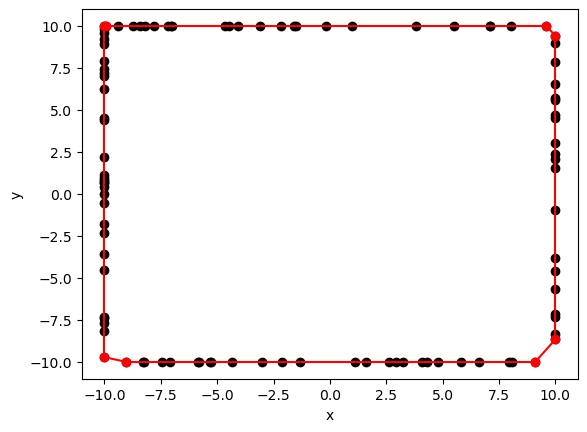

In [33]:
visualizeGraph( points_c , graham_points_c , "C_graham_Graph" )

Zbiór danych D

In [34]:
graham_points_d, vis_graham_d = graham_algorithm_draw(points_d)

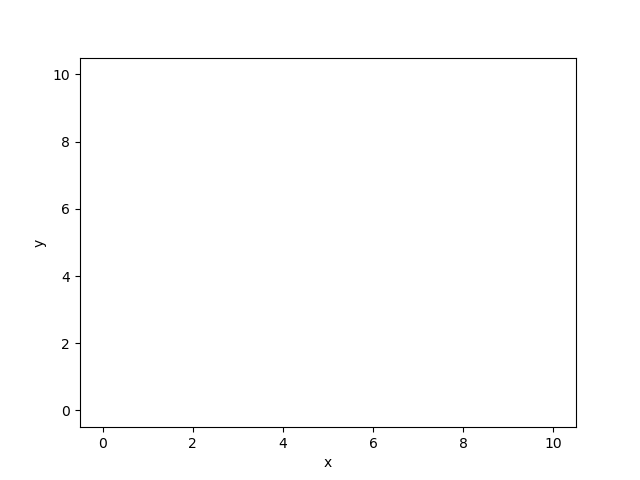

In [96]:
vis_graham_d.save_gif( ImgDir + "D_Graham_Gif" )
vis_graham_d.show_gif(interval=1)

In [97]:
pointsClassifactionPrint( graham_points_d , points_d )

Liczba wszystkich punktów : 86
Liczba punktów nie należących do otoczki : 82 
Liczba punktów należących do otoczki : 4 
Punkty należące do otoczki : [(0, 0), (10, 0), (10, 10), (0, 10)]


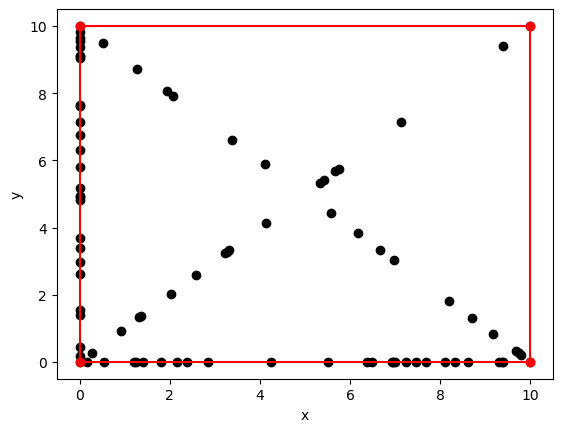

In [35]:
visualizeGraph( points_d , graham_points_d , "D_graham_Graph")

### Algorytm Jarvisa

Algorytm Jarvisa oblicza otoczkę wypukłą dla zbioru punktów $Q$ przez technikę zwaną owijaniem paczki (*package wrapping*) lub owijaniem prezentu (*gift wrapping*). Algorytm Jarvisa buduje sekwencję $H = \langle p_1, p_2, \dots, p_m \rangle$ będącą wierzchołkami $\mathcal{CH}(Q)$. Zaczynamy od punktu $p_0$, następny punkt $p_1$ w otoczce wypukłej ma najmniejszy kąt w odniesieniu do $p_0$ (w przypadku takiego samego kąta - wybiera się punkt najdalej od $p_0$). Podobnie, gdy $p_2$ ma najmniejszy kąt w odniesieniu do $p_1$, itd.. Zauważyć warto, że możemy tym sposobem obliczyć lewy i prawy łańcuch otoczki wypukłej $\mathcal{CH}(Q)$. Lewy łańcuch buduje się podobnie. Gdy osiągniemy najwyższy wierzchołej w prawym łańcuchu $p_k$, wybieramy wierzchołek $p_{k+1}$, który ma najmniejszy kąt w odniesieniu do $p_k$, ale od ujemnej osi-$x$. Można zaimplementować algorytm Jarvisa bez konstruowania pomocniczych łańcuchów - lewego i prawego. Taka implementacja utrzymuje śledzenie kąta ostatniej strony otoczki wypukłej i wymaga sekwencji kątów boków otoczki tylko rosnącej. (Patrząc na trzy ostatnie punkty jesteśmy w stanie obliczyć jaki punkt należy włączyć do $\mathcal{CH}(Q)$ w zależności od budowanego punktu)

<span style="color:red">Ćw.</span> Uzupełnij funkcję ```jarvis_algorithm```, która oblicza otoczkę wypukłą korzystając z algorytmu Jarvisa.

In [36]:
def jarvis_algorithm(Q):
    '''
    Funkcja buduje otoczkę wypukłą dla podanego
    zbioru punktów Q algorymem Jarvisa
    :parm Q: zbiór punktów
    :return: tablica punktów w postaci krotek współrzędnych
    '''
    def distance( x  , y ) :
        vx = x[0] - y[0]
        vy = x[1] - y[1]
        return vx*vx + vy*vy

    n = len( Q )
    if n < 3 :
        return sorted( Q ,  key = lambda x : ( x[1] , x[0] ) )

    start = min( Q , key = lambda x : ( x[1] , x[0] ) )

    H = []
    current = start

    while True :
        H.append( current )
        next = None

        for candidate in Q :

            if candidate == current :
                continue

            if next == None :
                next = candidate
                continue

            det = mat_det_3x3( current , next , candidate )

            if det < -eps :
                next = candidate

            elif det <= eps   :
                dist_candidate = distance( current , candidate )
                dist_next = distance( current , next )
                if dist_candidate > dist_next :
                    next = candidate

        current = next

        if current == start :
            break
    return H

Przetestuj swoją implementacje algorytmu Jarvisa, by sprawdzić czy poprawnie obliczana jest otoczka.

In [37]:
Test().runtest(2, jarvis_algorithm)

Lab 2, task 2:
	Test 1: Passed
	Test 2: Passed
	Test 3: Passed
	Test 4: Passed
	Test 5: Passed
	Test 6: Passed
	Test 7: Passed
	Test 8: Passed
	Test 9: Passed
	Test 10: Passed
	Test 11: Passed
Result: 11/11
Time: 1.406s


<span style="color:red">Ćw.</span> Uzupełnij funkcję ```jarvis_algorithm_draw```, która oblicza otoczkę wypukłą korzystając z algorytmu Jarvisa z dodatkową opcją wyświetlania kroków algorytmu.

In [39]:
def jarvis_algorithm_draw(Q):
    '''
    Funkcja buduje otoczkę wypukłą dla podanego
    zbioru punktów Q algorymem Jarvisa oraz 
    pokazuje poszczególne kroki algorymu
    :parm Q: zbiór punktów
    :return: krotka w postaci  (tablica punktów w postaci krotek współrzędnych,
                                wizualizer pokazujący kroki algorytmu) 
    '''
    def distance( x  , y ) :
        vx = x[0] - y[0]
        vy = x[1] - y[1]
        return vx*vx + vy*vy

    vis = Visualizer()
    vis.add_point( Q , color = notChecked )


    n = len( Q )
    if n < 3 :
        Q.sort( key = lambda x : ( x[1] , x[0] ) )
        if n >= 1 :
            vis.add_point( Q[0] , color = correct )
        for i in range( 1 , n ) :
            vis.add_line_segment( ( Q[i] , Q[i-1] ) , color = correct )
            vis.add_point( Q[i] , color = correct )
        return Q , vis

    start = min( Q , key = lambda x : ( x[1] , x[0] ) )

    H = []
    current = start

    while True :
        H.append(current)
        vis.add_point(current, color=correct )

        next = None
        po = None
        ls = None

        for candidate in Q:
            if candidate == current:
                continue

            if next is None:
                next = candidate
                po = vis.add_point(next, color=tempCorrect)
                ls = vis.add_line_segment((current, next), color=tempCorrect)
                continue

            det = mat_det_3x3(current, next, candidate)

            if det < -eps :
                if ls is not None:
                    vis.remove_figure(ls)
                if po is not None:
                    vis.remove_figure(po)

                next = candidate
                po = vis.add_point(next, color=tempCorrect)
                ls = vis.add_line_segment((current, next), color=tempCorrect)

            elif det <= eps :
                dist_candidate = distance(current, candidate)
                dist_next = distance(current, next)
                if dist_candidate > dist_next:
                    if ls is not None:
                        vis.remove_figure(ls)
                    if po is not None:
                        vis.remove_figure(po)

                    next = candidate
                    po = vis.add_point(next, color=tempCorrect)
                    ls = vis.add_line_segment((current, next), color=tempCorrect)

        vis.add_point(next, color=correct)
        vis.add_line_segment((current, next), color=correct)

        current = next

        if current == start :
            break
    return H , vis

Zwizualizuj swoją implementację algorytmu.

### Kolory na Wizualizacjach algorytmu Jarvisa :
- Zielony: Punkt, który nie został jeszcze sprawdzony.
- Pomarańczowy: Punkt aktualnie sprawdzany.
- Czerwony: Punkt należący do Otoczki Wypukłej

Zbiór danych A

In [61]:
jarvis_points_a, vis_jarvis_a = jarvis_algorithm_draw(points_a)

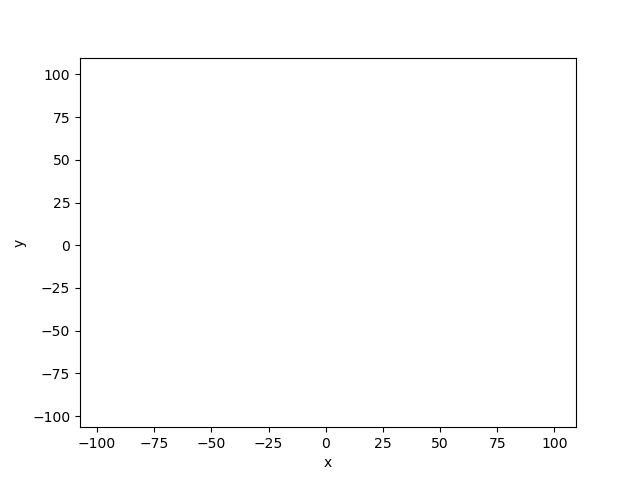

In [62]:
vis_jarvis_a.save_gif( ImgDir + "A_Jarvis_Gif" )
vis_jarvis_a.show_gif(interval = 1 )

In [103]:
pointsClassifactionPrint( graham_points_a , points_a )

Liczba wszystkich punktów : 100
Liczba punktów nie należących do otoczki : 88 
Liczba punktów należących do otoczki : 12 
Punkty należące do otoczki : [(np.float64(13.188928610106274), np.float64(-98.64718760199945)), (np.float64(93.16730639842552), np.float64(-70.56862002140056)), (np.float64(98.93076572885892), np.float64(-64.10042610612163)), (np.float64(98.71347257263474), np.float64(63.740702040785095)), (np.float64(90.43908196309548), np.float64(77.99265742840103)), (np.float64(78.11143758577145), np.float64(94.65295822373378)), (np.float64(58.10482661140668), np.float64(98.41629323767228)), (np.float64(-9.670318347828186), np.float64(96.40094830439091)), (np.float64(-77.18686025146751), np.float64(90.16197001682445)), (np.float64(-98.1302850999511), np.float64(80.12972423101837)), (np.float64(-98.75829668257413), np.float64(-39.87165884593977)), (np.float64(-85.33149127347636), np.float64(-88.99872091875527))]


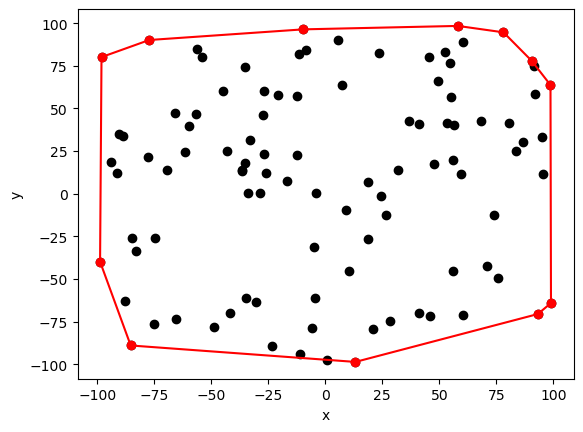

In [41]:
visualizeGraph( points_a , jarvis_points_a , "A_Jarvis_Graph" )

Zbiór danych B

In [63]:
jarvis_points_b, vis_jarvis_b = jarvis_algorithm_draw(points_b)

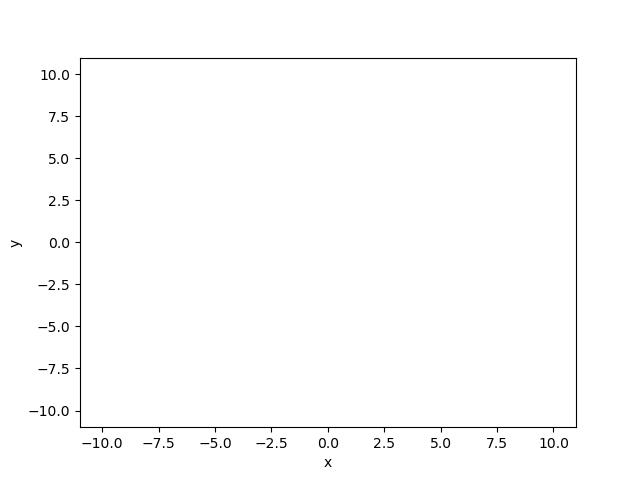

In [64]:
vis_jarvis_b.save_gif( ImgDir + "B_Jarvis_Gif" )
vis_jarvis_b.show_gif()

In [106]:
pointsClassifactionPrint( graham_points_b , points_b )

Liczba wszystkich punktów : 100
Liczba punktów nie należących do otoczki : 0 
Liczba punktów należących do otoczki : 100 
Punkty należące do otoczki : [(np.float64(0.35719527512495297), np.float64(-9.99361854062023)), (np.float64(0.5516000078353471), np.float64(-9.984775281965842)), (np.float64(0.6811442079661532), np.float64(-9.97677515873512)), (np.float64(2.3605812248253524), np.float64(-9.7173893758047)), (np.float64(2.935076470294428), np.float64(-9.559567255557335)), (np.float64(4.380185321904426), np.float64(-8.989659423235844)), (np.float64(4.6903645904241795), np.float64(-8.831788041438438)), (np.float64(5.890641893343966), np.float64(-8.08086245919215)), (np.float64(6.131785171776727), np.float64(-7.899443689727717)), (np.float64(6.202156561875166), np.float64(-7.844313480604202)), (np.float64(6.221629765307303), np.float64(-7.828877509799358)), (np.float64(6.793583108384169), np.float64(-7.33806708537591)), (np.float64(6.994062322693752), np.float64(-7.147243680348088)), (np

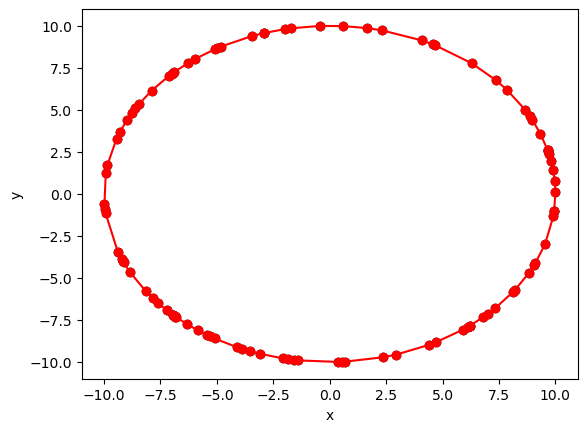

In [43]:
visualizeGraph( points_b , jarvis_points_b  , "B_Jarvis_Graph")

Zbiór danych C

In [65]:
jarvis_points_c, vis_jarvis_c = jarvis_algorithm_draw(points_c)

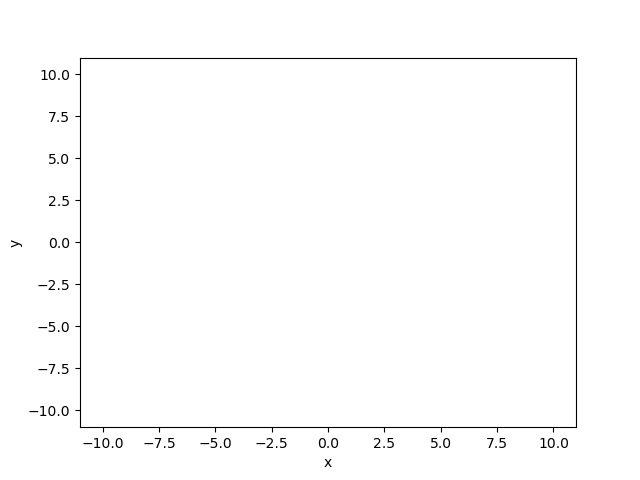

In [66]:
vis_jarvis_c.save_gif( ImgDir + "C_Jarvis_Gif" )
vis_jarvis_c.show_gif()

In [109]:
pointsClassifactionPrint( graham_points_c , points_c )

Liczba wszystkich punktów : 100
Liczba punktów nie należących do otoczki : 92 
Liczba punktów należących do otoczki : 8 
Punkty należące do otoczki : [(-9.023993096445757, -10), (9.105599152578385, -10), (10, -8.66074432616637), (10, 9.429428205238565), (9.581134129044258, 10), (-9.920763366224115, 10), (-10, 9.971967501615495), (-10, -9.716502320777039)]


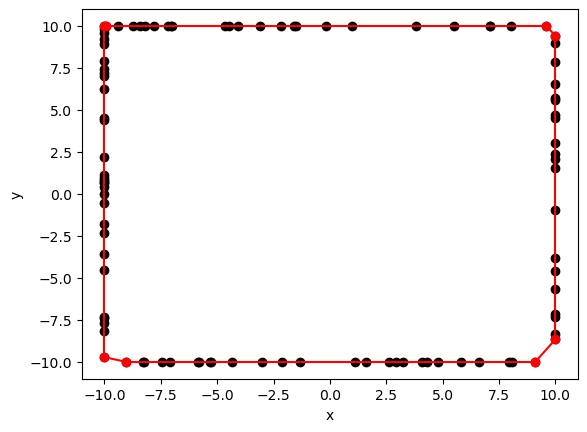

In [45]:
visualizeGraph( points_c , jarvis_points_c , "C_Jarvis_Graph")

Zbiór danych D

In [67]:
jarvis_points_d, vis_jarvis_d = jarvis_algorithm_draw(points_d)

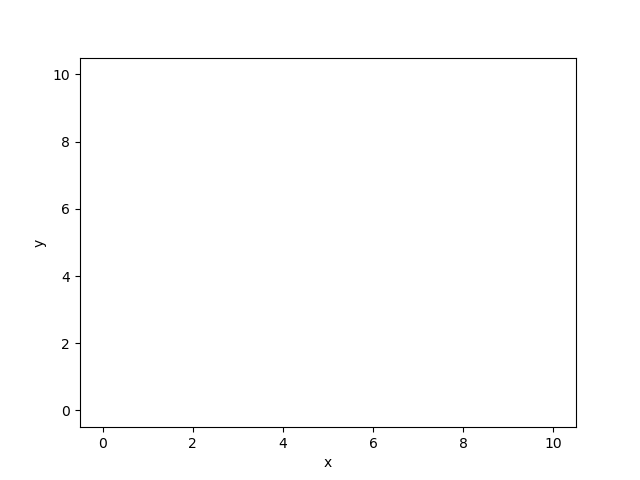

In [68]:
vis_jarvis_d.save_gif( ImgDir + "D_Jarvis_Gif" )
vis_jarvis_d.show_gif()

In [112]:
pointsClassifactionPrint( graham_points_d , points_d  )

Liczba wszystkich punktów : 86
Liczba punktów nie należących do otoczki : 82 
Liczba punktów należących do otoczki : 4 
Punkty należące do otoczki : [(0, 0), (10, 0), (10, 10), (0, 10)]


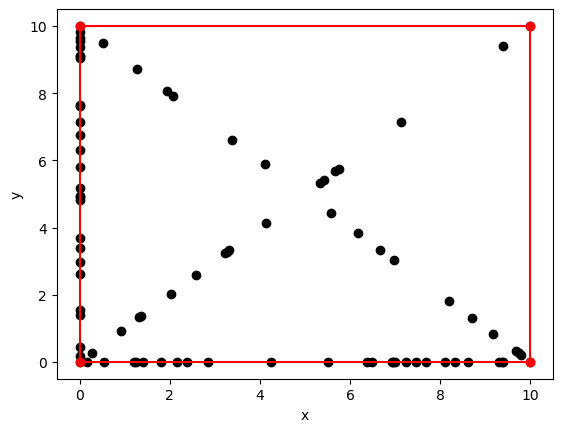

In [47]:
visualizeGraph( points_d , jarvis_points_d , "D_Jarvis_Graph" )


---

Po zobaczeniu i przetestowaniu wstępnie zbiorów danych, przyszła kolej na porównanie czasów działania dla różnych danych. Do tego potrzebujemy bardziej miarodajnych zbiorów danych.  
<span style="color:red">Ćw.</span> Stwórz zmodyfikowane zbiory danych A, B, C oraz D - tak jak uważasz za słuszne.

In [115]:
dataSetNumbers = [ 50 , 100 ,500 ,1000 , 2500 , 5000 , 10000 , 25000 , 30000, 40000 , 50000 , 60000 , 70000 , 80000 , 90000 , 100000 ]

In [116]:
result_list = []

for setNum in dataSetNumbers :
    points = generate_uniform_points(-100, 100, setNum )

    t0 = time()
    graham_points = graham_algorithm( points )
    graham_time = time() - t0

    t0 = time()
    jarvis_points = jarvis_algorithm( points )
    jarvis_time = time() - t0

    result_list.append( {
        'Liczba pkt': setNum,
        'Otoczka Graham': len( graham_points ),
        'Czas Graham ' : graham_time ,
        'Otoczka Jarvis': len( jarvis_points ),
        'Czas Jarvis' : jarvis_time
        } )

final_dataframe = pd.DataFrame(result_list)
print( final_dataframe )
final_dataframe.to_csv( ReportsDir + 'A.csv', index=False)

    Liczba pkt  Otoczka Graham  Czas Graham   Otoczka Jarvis  Czas Jarvis
0           50              13      0.000858              13     0.000679
1          100              12      0.000858              12     0.001064
2          500              17      0.002049              17     0.004448
3         1000              20      0.003468              20     0.017341
4         2500              22      0.010972              22     0.047038
5         5000              20      0.022660              20     0.053472
6        10000              27      0.060858              27     0.196663
7        25000              31      0.156584              31     0.621511
8        30000              28      0.200397              28     0.686224
9        40000              28      0.312514              28     0.983724
10       50000              21      0.347914              21     1.031829
11       60000              27      0.624020              27     1.625266
12       70000              34      0.

In [118]:
result_list = []

for i in range( len( dataSetNumbers )-6 ) :
    setNum = dataSetNumbers[i]
    points = generate_circle_points((0,0), 10, setNum )

    t0 = time()
    graham_points = graham_algorithm( points )
    graham_time = time() - t0

    t0 = time()
    jarvis_points = jarvis_algorithm( points )
    jarvis_time = time() - t0

    result_list.append( {
        'Liczba pkt': setNum,
        'Otoczka Graham': len( graham_points ),
        'Czas Graham ' : graham_time ,
        'Otoczka Jarvis': len( jarvis_points ),
        'Czas Jarvis' : jarvis_time
        } )

final_dataframe = pd.DataFrame(result_list)
print( final_dataframe )
final_dataframe.to_csv(ReportsDir + 'B.csv', index=False)

   Liczba pkt  Otoczka Graham  Czas Graham   Otoczka Jarvis  Czas Jarvis
0          50              50      0.001381              50     0.008814
1         100             100      0.001243             100     0.013328
2         500             500      0.004838             500     0.971499
3        1000            1000      0.010955            1000     1.730566
4        2500            2500      0.035624            2500     5.336090
5        5000            5000      0.021778            5000    23.788171
6       10000           10000      0.047047           10000    85.968130
7       25000           25000      0.156393           25000   681.255950
8       30000           30000      0.171379           30000   912.791376
9       40000           40000      0.223484           40000  2400.529242


In [119]:
result_list = []

for setNum in dataSetNumbers :
    points = generate_rectangle_points( (-10, -10), (10, -10), (10, 10), (-10, 10), setNum )

    t0 = time()
    graham_points = graham_algorithm( points )
    graham_time = time() - t0

    t0 = time()
    jarvis_points = jarvis_algorithm( points )
    jarvis_time = time() - t0

    result_list.append( {
        'Liczba pkt': setNum,
        'Otoczka Graham': len( graham_points ),
        'Czas Graham ' : graham_time ,
        'Otoczka Jarvis': len( jarvis_points ),
        'Czas Jarvis' : jarvis_time
        } )

final_dataframe = pd.DataFrame(result_list)
print( final_dataframe )
final_dataframe.to_csv(ReportsDir + 'C.csv', index=False)

    Liczba pkt  Otoczka Graham  Czas Graham   Otoczka Jarvis  Czas Jarvis
0           50               8      0.000788               8     0.008748
1          100               8      0.000397               8     0.000439
2          500               8      0.002048               8     0.001848
3         1000               8      0.003878               8     0.003420
4         2500               8      0.021760               8     0.013529
5         5000               8      0.023740               8     0.019367
6        10000               8      0.059448               8     0.039515
7        25000               8      0.124610               8     0.143605
8        30000               8      0.145372               8     0.118913
9        40000               8      0.176439               8     0.213088
10       50000               8      0.236481               8     0.267182
11       60000               8      0.458533               8     0.382534
12       70000               8      0.

In [120]:
result_list = []

for setNum in dataSetNumbers :
    points = generate_square_points((0, 0), (10, 0), (10, 10), (0, 10) , setNum , setNum  )

    t0 = time()
    graham_points = graham_algorithm( points )
    graham_time = time() - t0

    t0 = time()
    jarvis_points = jarvis_algorithm( points )
    jarvis_time = time() - t0

    result_list.append( {
        'Liczba pkt boki': setNum,
        'Liczba pkt krawedzie': setNum,
        'Otoczka Graham': len( graham_points ),
        'Czas Graham ' : graham_time ,
        'Otoczka Jarvis': len( jarvis_points ),
        'Czas Jarvis' : jarvis_time
        } )

final_dataframe = pd.DataFrame(result_list)
final_dataframe.to_csv( ReportsDir + 'D.csv', index=False)

Bibliografia:
- Wprowadzenie do algorytmów wydanie 3, Thomas H. Cormen, Charles E. Leiserson, Ronald L. Rivest, Stein Clifford
